Installing Dependencies.

In [ ]:
import os #Used to Create a Helper Variable, which Allows us to Manage Different Paths in the Code.

In [ ]:
import glob #Glob is Used to Return All File Paths that Match a Specific Pattern.

In [ ]:
#If we want to Display a Single Image, the the "Image" Library is Fine, But if want to Display Multiple Images by Just Running a Single Cell,
#Then, We Need to "import display".
from IPython.display import Image, display 

Creating a Helper Variable.

In [ ]:
HOME = "/content/"
print(HOME)

/content/


In [ ]:
!pip install ultralytics==8.0.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.8/219.8 KB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 KB 21.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 KB 759.7 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 KB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 81.9 MB/s eta 0:00:00
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144575 sha256=1795462bbf15648fd0ebf8c6bcb198fe990d5d60d561aee39fa26281aaa76467
  Stored in directory: /root/.cache/pip/wheels/23/cf/80/f3efa822e6ab23277902ee9165fe772eeb1dfb8014f359020a
Succes

Checking if YOLOv8 is Working Fine.

In [ ]:
import ultralytics

In [ ]:
ultralytics.checks()

Ultralytics YOLOv8.0.0 🚀 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 25.4/78.2 GB disk)


Importing Dataset from Roboflow.

In [ ]:
!mkdir {HOME}/datasets

In [ ]:
%cd {HOME}/datasets

/content/datasets


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="5yJRuawnRy1f6PcbrZTP")
project = rf.workspace("roboflow-100").project("road-signs-6ih4y")
dataset = project.version(1).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 9.2 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=4358dcc79cd6d9f07ac2fa4c15897dd855c732441a140dc110d35618c9c1a3f6
  Stored in directory: /root/.cache/pip/wheels/04/5f/3e/46cc37c5d698415694d83f607f833f83f0149e49b3af9d0f38
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: cycler
    Found existing installation: cycler 0.11.0
    Uninstalling cycler-0.11.0:
      Successfully uninstalled cycler-0.11.0


loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to road-signs-1 in yolov5pytorch:: 100%|██████████| 4198/4198 [00:01<00:00, 2542.34it/s]


Training YOLOv8 Model on Custom Dataset.

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data='/content/datasets/road-signs-1/data.yaml' epochs=100 imgsz=640

/content
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/road-signs-1/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, retina_masks=False, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, workspace=4, nms=False, lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3

Checking Files in Training Directory.

In [ ]:
!ls {HOME}/runs/detect/train6/

args.yaml					    train_batch2.jpg
confusion_matrix.png				    train_batch7740.jpg
events.out.tfevents.1678537033.3521dca25659.2550.0  train_batch7741.jpg
F1_curve.png					    train_batch7742.jpg
P_curve.png					    val_batch0_labels.jpg
PR_curve.png					    val_batch0_pred.jpg
predictions.json				    val_batch1_labels.jpg
R_curve.png					    val_batch1_pred.jpg
results.csv					    val_batch2_labels.jpg
results.png					    val_batch2_pred.jpg
train_batch0.jpg				    weights
train_batch1.jpg


Visualizing Confusion Matrix.

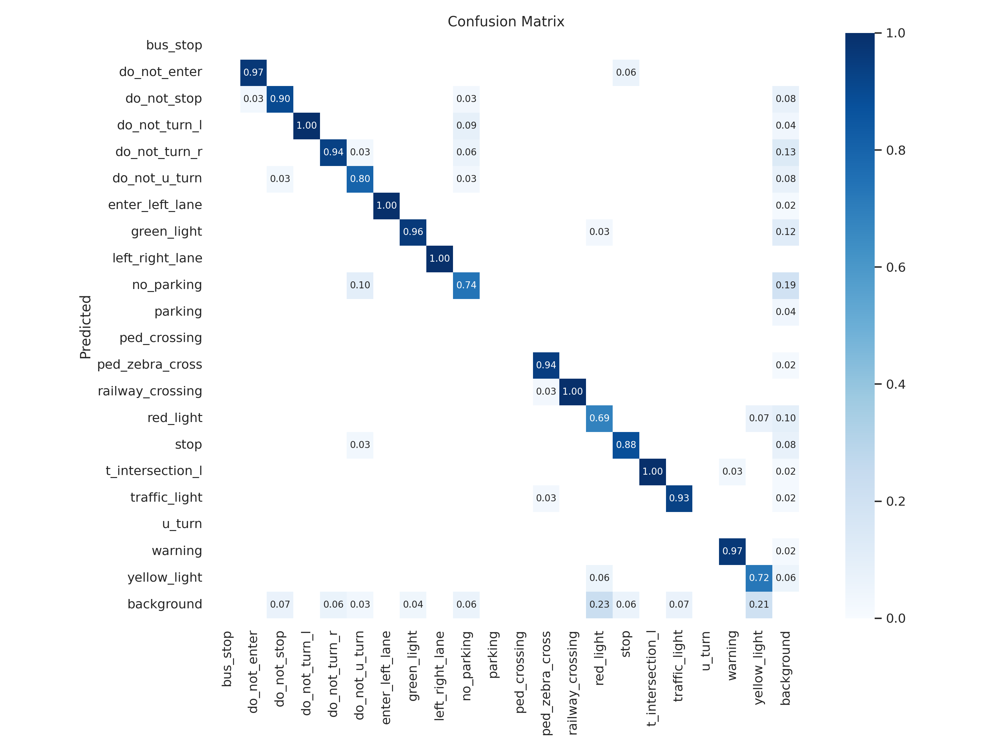

In [ ]:
from IPython.display import Image
Image(filename = f"{HOME}/runs/detect/train6/confusion_matrix.png")

Checking Prediction on Validation Batch.

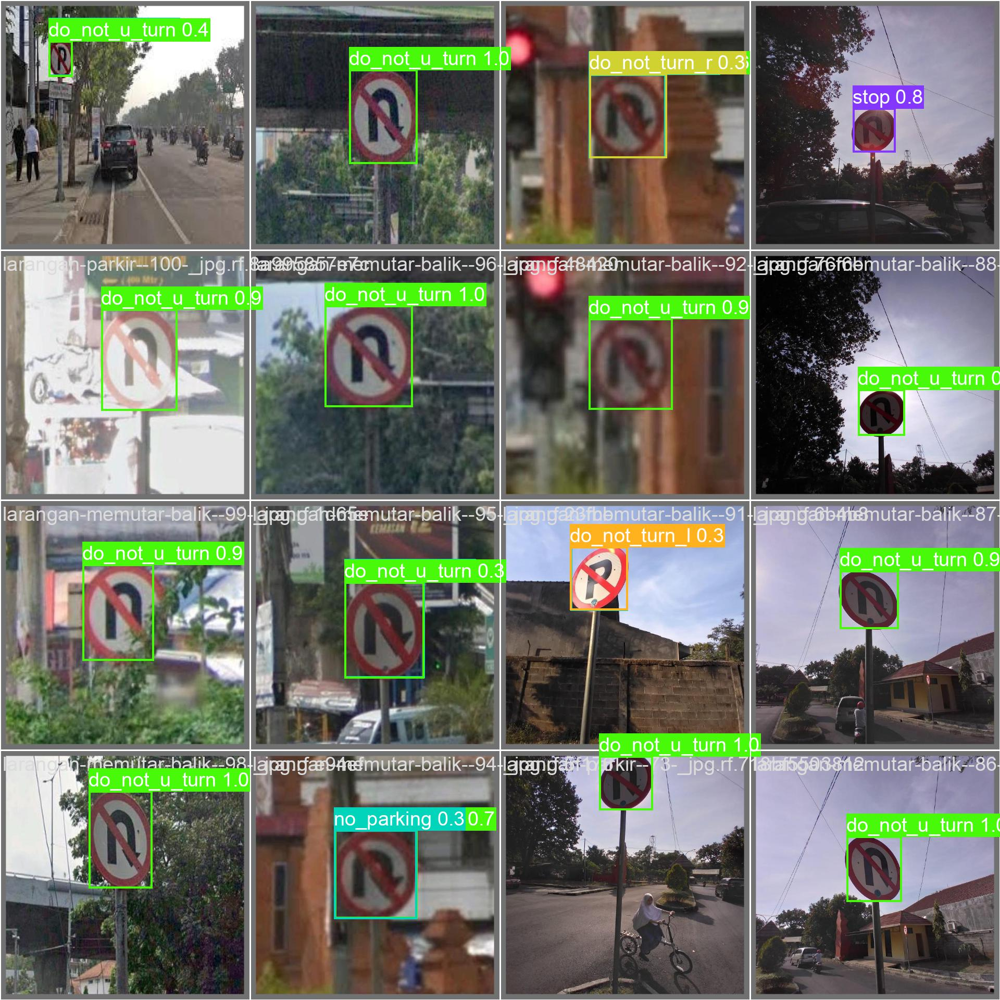

In [ ]:
Image(filename = f"{HOME}/runs/detect/train6/val_batch2_pred.jpg", height = 400, width = 800)

Visualizing Training and Validation Loss.

/content


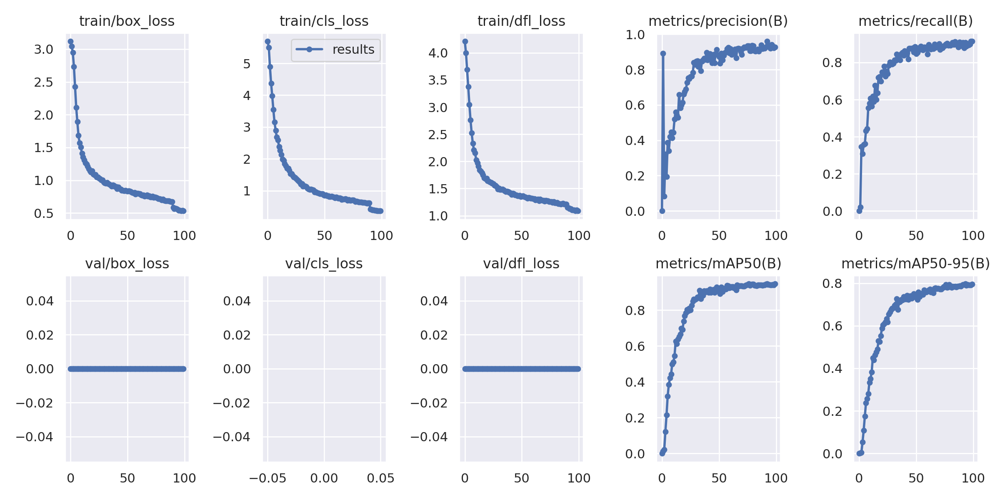

In [ ]:
%cd {HOME}
Image(filename = f"{HOME}/runs/detect/train6/results.png", height = 600, width = 1200)

Validate Custom Model.

In [ ]:
!yolo task=detect mode=val model='{HOME}/runs/detect/train6/weights/best.pt' data={dataset.location}/data.yaml

Ultralytics YOLOv8.0.0 🚀 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Fusing layers... 
Model summary: 168 layers, 11133711 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/datasets/road-signs-1/valid/labels.cache... 488 images, 0 backgrounds, 0 corrupt: 100% 488/488 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 31/31 [00:10<00:00,  2.87it/s]
                   all        488        529      0.933      0.908      0.942      0.796
          do_not_enter        488         30      0.934      0.946      0.989      0.892
           do_not_stop        488         30      0.895        0.9      0.952      0.882
         do_not_turn_l        488         34      0.952          1      0.995      0.902
         do_not_turn_r        488         31      0.881      0.935      0.959        0.9
         do_not_u_turn        488         30      0.985      0.867      0.948      0.823
       enter_left_lane      

Inferencing the Custom Model.

In [ ]:
!gdown "https://drive.google.com/file/d/1mGma93EK4A42ARo1yd0_Y41Bgeh0FPU7/view?usp=share_link"

/usr/local/lib/python3.9/dist-packages/gdown/parse_url.py:35: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=1mGma93EK4A42ARo1yd0_Y41Bgeh0FPU7
  warnings.warn(
Downloading...
From: https://drive.google.com/file/d/1mGma93EK4A42ARo1yd0_Y41Bgeh0FPU7/view?usp=share_link
To: /content/view?usp=share_link
588kB [00:00, 38.5MB/s]


In [ ]:
!gdown "https://drive.google.com/file/d/12eUsUtcnow1wHjsRycACXYO2fTOQHxAU/view?usp=share_link"

/usr/local/lib/python3.9/dist-packages/gdown/parse_url.py:35: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=12eUsUtcnow1wHjsRycACXYO2fTOQHxAU
  warnings.warn(
Downloading...
From: https://drive.google.com/file/d/12eUsUtcnow1wHjsRycACXYO2fTOQHxAU/view?usp=share_link
To: /content/view?usp=share_link
1.01MB [00:00, 96.0MB/s]


Predicting Video Script (Test_1.mp4)

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model='{HOME}/runs/detect/train6/weights/best.pt' conf=0.25 source='/Test_1.mp4'

Display Output of Video.

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

#Input Video Path:
save_path = f'/content/runs/detect/predict8/Test_1.mp4'

#Compressed Video Path:
compressed_path = "/content/compressed_result.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")
          
#Show Video:
mp4 = open(compressed_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width-400 controls>
       <source src="%s" type="video/mp4">
</video>
""" % data_url)

Predicting Video Script (Test_2.mp4)

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model='{HOME}/runs/detect/train6/weights/best.pt' conf=0.25 source='/Test_2.mp4'

/content
Ultralytics YOLOv8.0.0 🚀 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Fusing layers... 
Model summary: 168 layers, 11133711 parameters, 0 gradients, 28.5 GFLOPs
video 1/1 (1/529) /Test_2.mp4: 384x640 1 do_not_stop, 1 do_not_turn_l, 16.9ms
video 1/1 (2/529) /Test_2.mp4: 384x640 1 do_not_stop, 1 do_not_turn_l, 29.0ms
video 1/1 (3/529) /Test_2.mp4: 384x640 1 do_not_stop, 1 do_not_turn_l, 27.5ms
video 1/1 (4/529) /Test_2.mp4: 384x640 1 do_not_stop, 1 do_not_turn_l, 2 green_lights, 24.0ms
video 1/1 (5/529) /Test_2.mp4: 384x640 1 do_not_stop, 1 do_not_turn_l, 33.1ms
video 1/1 (6/529) /Test_2.mp4: 384x640 1 do_not_stop, 1 do_not_turn_l, 24.0ms
video 1/1 (7/529) /Test_2.mp4: 384x640 1 do_not_stop, 1 do_not_turn_l, 28.4ms
video 1/1 (8/529) /Test_2.mp4: 384x640 1 do_not_turn_l, 25.4ms
video 1/1 (9/529) /Test_2.mp4: 384x640 1 do_not_turn_l, 14.3ms
video 1/1 (10/529) /Test_2.mp4: 384x640 1 do_not_turn_l, 16.6ms
video 1/1 (11/529) /Test_2.mp4: 384x640 1 do_not_stop, 1 do_no

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

#Input Video Path:
save_path = f'/content/runs/detect/predict9/Test_2.mp4'

#Compressed Video Path:
compressed_path = "/content/compressed_result.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")
          
#Show Video:
mp4 = open(compressed_path, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width-400 controls>
       <source src="%s" type="video/mp4">
</video>
""" % data_url)